In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from tqdm import tqdm
from tools_ryu import mytool
from tools_ryu.cross_sectional_v2 import CrossSectional

In [2]:
cmktcap = pd.read_pickle("Data/cmktcap_data_final.pickle")
cmktcap_reduced = pd.read_pickle("Data/cmktcap_data_reduced.pickle")
binance = pd.read_pickle("Data/binance_data_pp.pickle")

In [6]:
# Initialize the Data
c_mkt = CrossSectional(cmktcap,"coinmarketcap")
c_mkt_reduced = CrossSectional(cmktcap_reduced, "coinmarketcap")
b_mkt = CrossSectional(binance, "binance")

In [7]:
#                  mktcap, volume
group_value = {
               "M1":[1_000_000, None],
               "M2":[1_000_000,1_000_000],
               "M3":[1_000_000,5_000_000]}

In [11]:
# 코인 마켓켑 인덱스 생성
market_index_cmktcap = {}
coin_num_cmktcap = {}

for key, value_lst in tqdm(group_value.items()):
    rtn, num = c_mkt.make_market_index(value_lst[0],value_lst[1])
    market_index_cmktcap[key] = rtn
    coin_num_cmktcap[key] = num

100%|██████████| 3/3 [00:30<00:00, 10.14s/it]


In [12]:
# 코인 마켓켑 인덱스 (바이낸스와 컬럼 일치) 생성
market_index_cmktcap_reduced = {}
coin_num_cmktcap_reduced = {}

for key, value_lst in tqdm(group_value.items()):
    rtn, num = c_mkt_reduced.make_market_index(value_lst[0],value_lst[1])
    market_index_cmktcap_reduced[key] = rtn
    coin_num_cmktcap_reduced[key] = num

100%|██████████| 3/3 [00:02<00:00,  1.45it/s]


In [35]:
# 코인마켓켑
value_weighted_cmktcap = {}
value_weighted_num_cmktcap = {}

for key, value_lst in group_value.items():
    rtn, num = c_mkt_reduced.weekly_momentum_value_weighted(5, day_of_week="SUN", number_of_coin_group=20, 
                                                        mktcap_value = value_lst[0],
                                                        vol_value= value_lst[1])
    value_weighted_cmktcap[key] = rtn
    value_weighted_num_cmktcap[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 5/5 [00:01<00:00,  3.40it/s]


In [42]:
index_m1 = value_weighted_cmktcap["M3"]

index_m1["Long-Short"]

2021-01-24    0.000000
2021-01-25   -0.051084
2021-01-26    0.058315
2021-01-27    0.027882
2021-01-28   -0.000192
                ...   
2023-04-12   -0.007371
2023-04-13    0.010489
2023-04-14    0.033498
2023-04-15    0.006786
2023-04-16    0.017252
Length: 813, dtype: float64

In [43]:
d = {"Market": market_index_cmktcap["M3"].loc["2021-01-24":],
 "LS":index_m1["Long-Short"]}

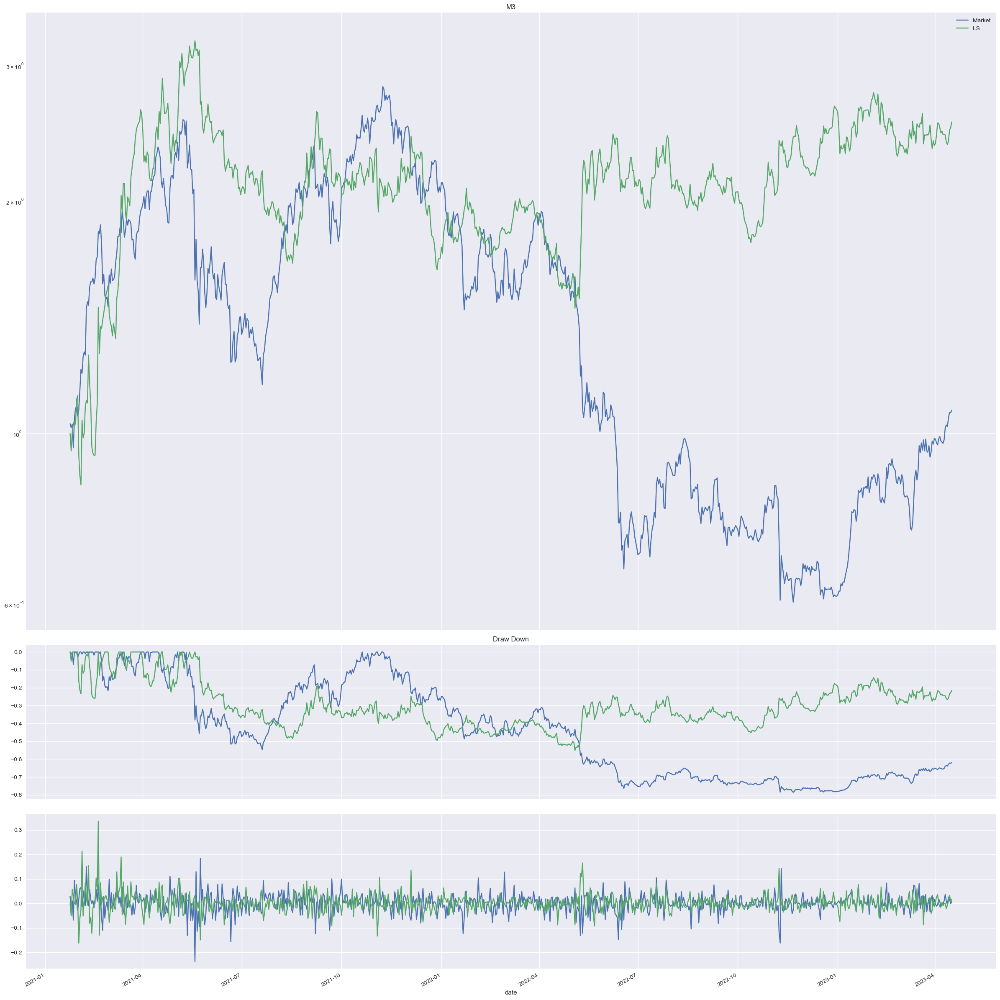

In [44]:
mytool.draw_return_result(d, title="M3",
                          one_plot=True)

In [89]:
mytool.print_statistics(value_weighted_cmktcap["M3"])

,G1,G2,G3,G4,G5,Long-Short
CAGR,-0.650200,-0.232300,-0.009000,-0.054100,0.136500,1.157200
Mean,-0.476130,0.173570,0.385750,0.356890,0.602240,1.078360
STD,1.053379,0.933559,0.871335,0.883982,0.960692,0.772833
MDD,0.998000,0.979000,0.915000,0.938000,0.937000,0.522000
Sharpe,-0.452003,0.185923,0.442712,0.403730,0.626881,1.395334


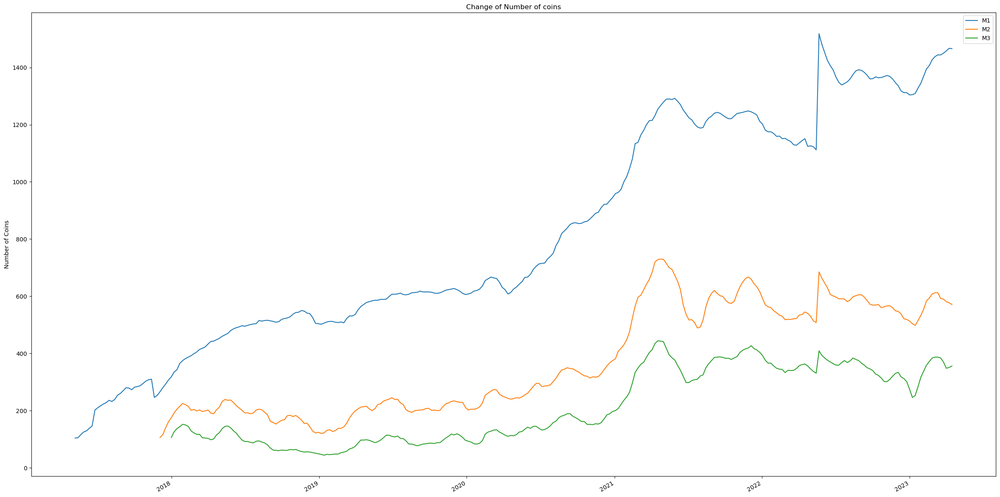

In [90]:
mytool.draw_coin_count(value_weighted_num_cmktcap, draw_mkt=False)

In [ ]:
day_list = ["MON","TUE","WED","THU","FRI","SAT"]

In [78]:
# 코인 마켓켑 축소
value_weighted_cmktcap_reduced = {}
value_weighted_num_cmktcap_reduced = {}

for key, value_lst in group_value.items():
    rtn, num = c_mkt_reduced.weekly_momentum_value_weighted(4,"SUN", 15, value_lst[0],value_lst[1])
    value_weighted_cmktcap_reduced[key] = rtn
    value_weighted_num_cmktcap_reduced[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 4/4 [00:01<00:00,  3.57it/s]


In [82]:
mytool.print_statistics(value_weighted_cmktcap_reduced["M3"])

,G1,G2,G3,G4,Long-Short
CAGR,-0.125800,0.759500,0.509200,1.317900,0.914200
Mean,0.413460,0.982730,0.787490,1.321130,0.907670
STD,1.017426,0.885968,0.834344,0.950623,0.708497
MDD,0.918000,0.803000,0.784000,0.899000,0.665000
Sharpe,0.406378,1.109216,0.943844,1.389752,1.281121


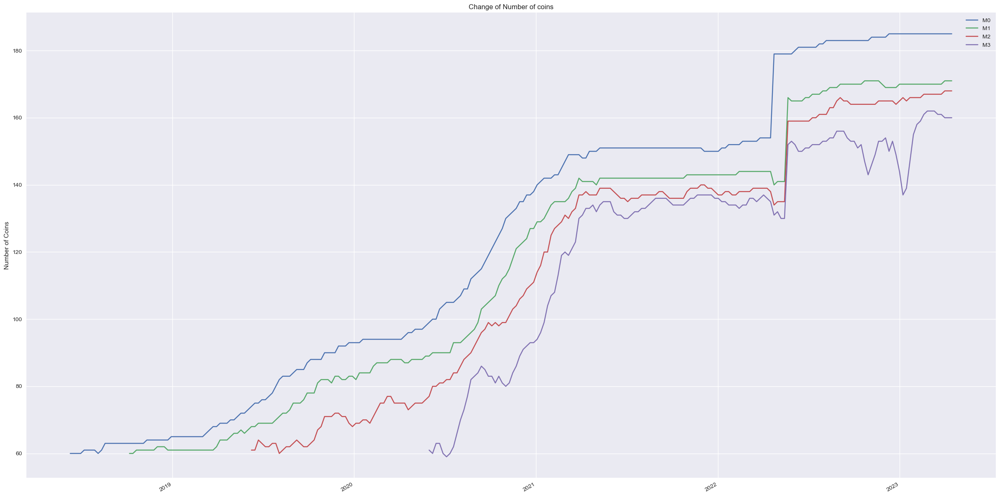

In [24]:
mytool.draw_coin_count(value_weighted_num_cmktcap_reduced, draw_mkt=False)

In [25]:
# 바이낸스
value_weighted_binance = {}
value_weighted_num_binance = {}

for key, value_lst in group_value.items():
    rtn, num = b_mkt.weekly_momentum_value_weighted(4,"SUN", 15, value_lst[0],value_lst[1])
    value_weighted_binance[key] = rtn
    value_weighted_num_binance[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 4/4 [00:01<00:00,  3.52it/s]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


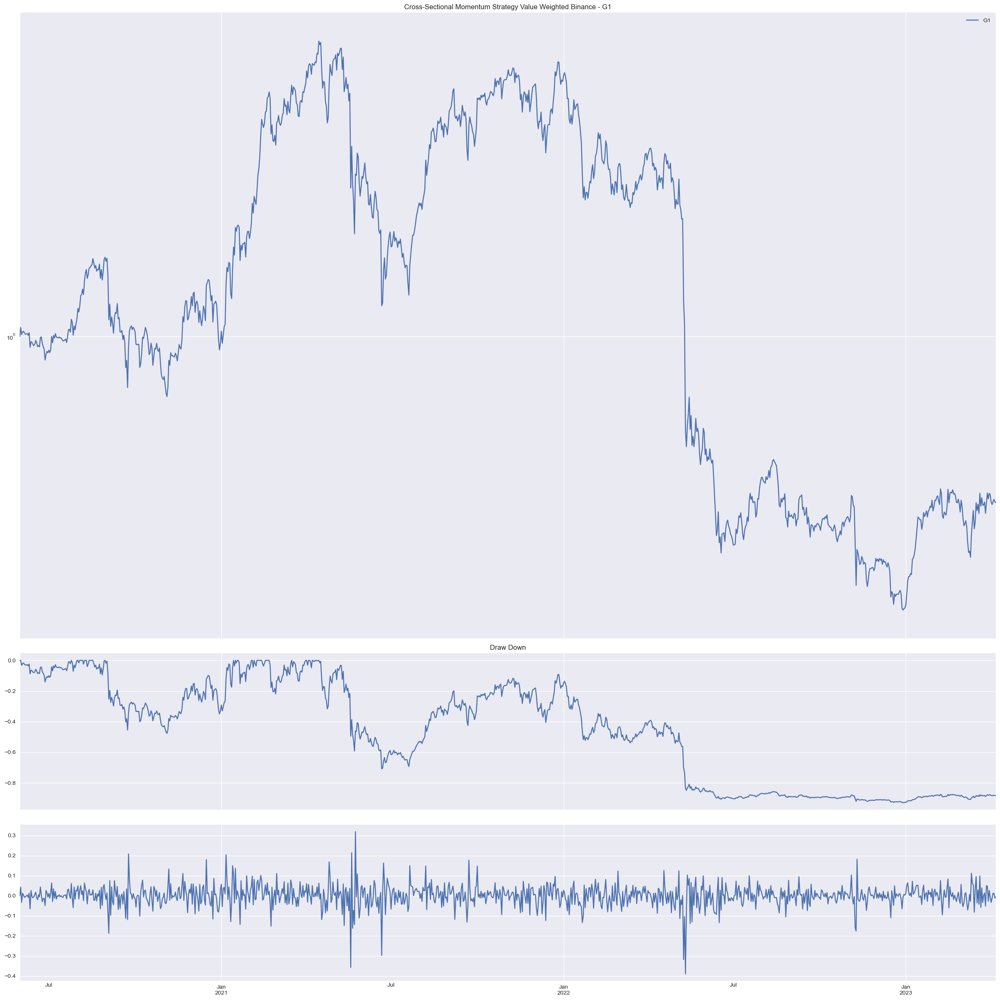

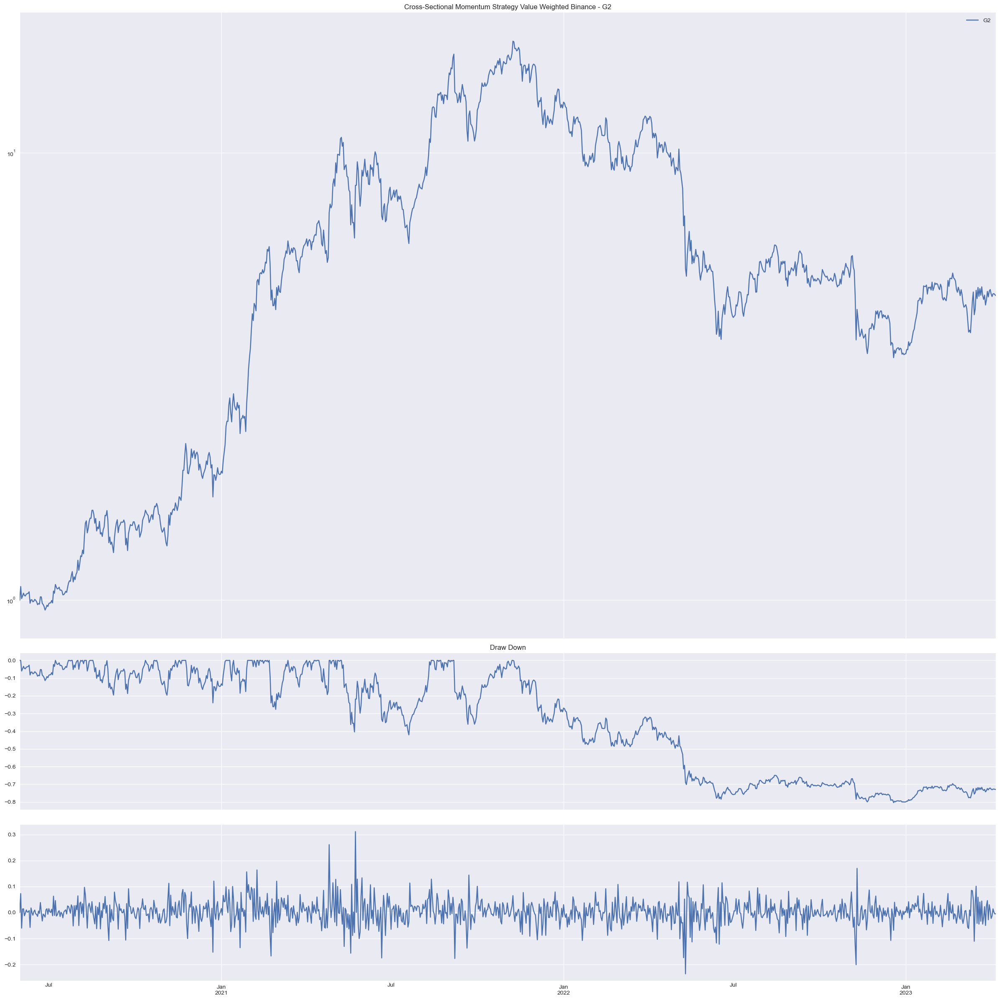

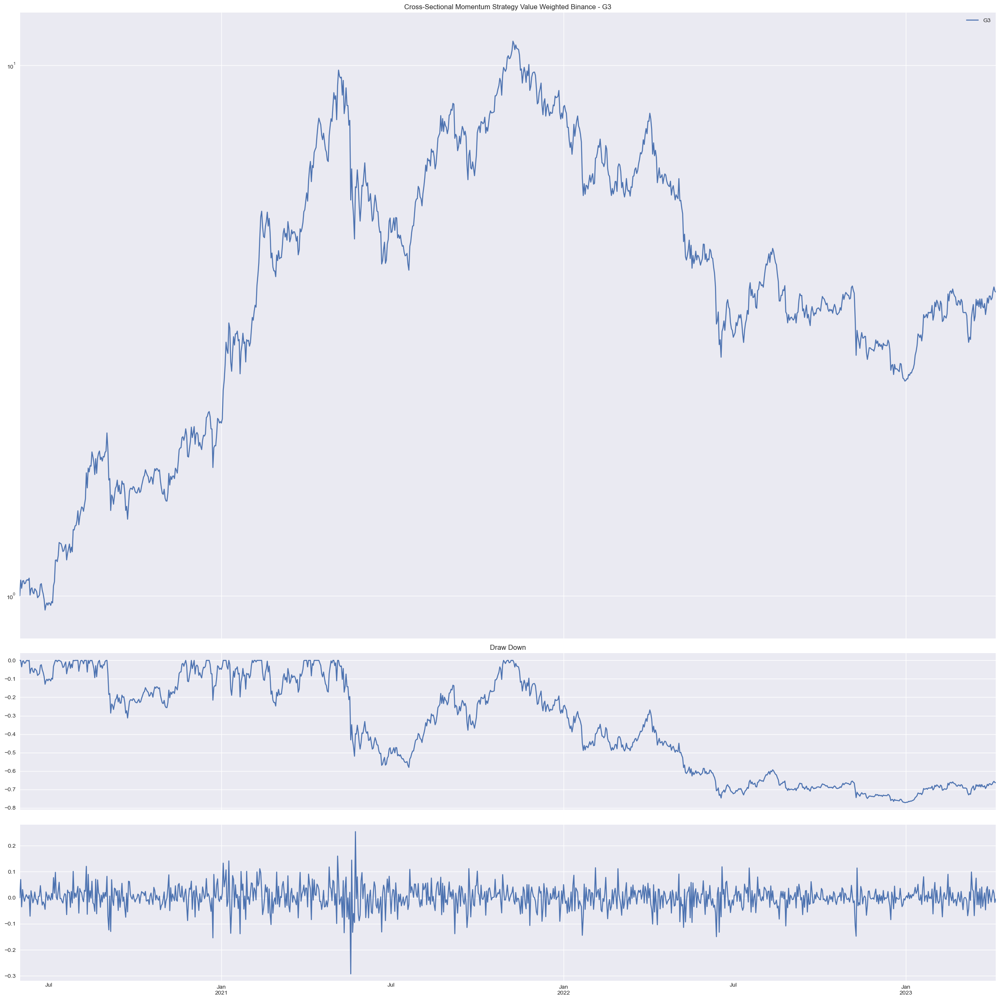

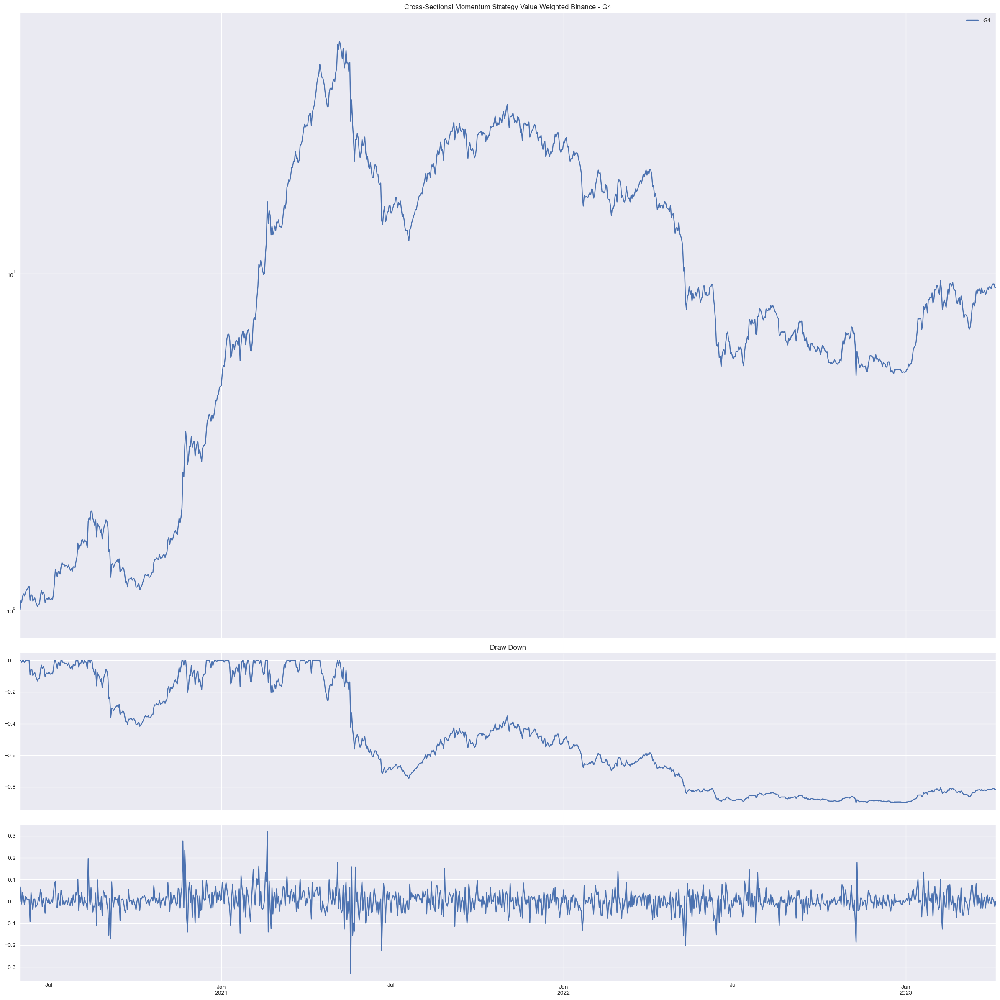

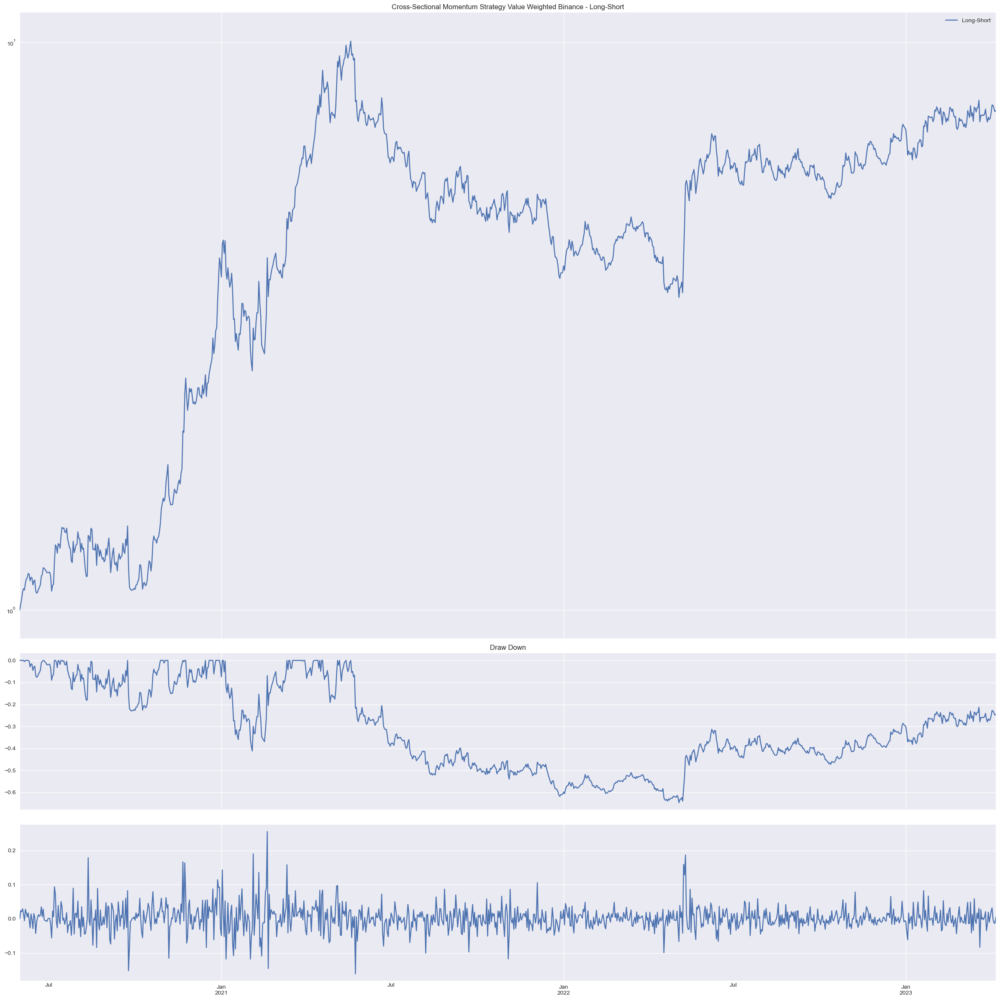

In [26]:
mytool.draw_return_result(value_weighted_binance["M3"],
                          title="Cross-Sectional Momentum Strategy Value Weighted Binance")

In [51]:
mytool.print_statistics(value_weighted_binance["M3"])

,G1,G2,G3,G4,Long-Short
CAGR,-0.248900,0.690000,0.550300,1.119200,1.018100
Mean,0.288240,0.949640,0.827240,1.243940,0.955700
STD,1.036672,0.894157,0.849174,0.965980,0.705554
MDD,0.929000,0.804000,0.771000,0.899000,0.646000
Sharpe,0.278044,1.062050,0.974171,1.287749,1.354539


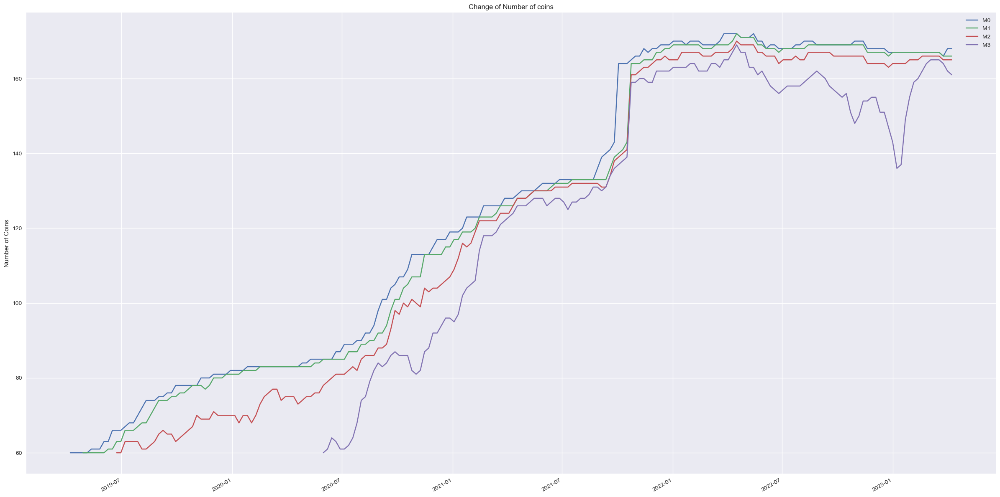

In [28]:
mytool.draw_coin_count(value_weighted_num_binance,draw_mkt=False)

Momentum Weighted 전략구현

In [29]:
momentum_weighted_cmktcap = {}
momentum_weighted_num_cmktcap = {}

for key, value_lst in group_value.items():
    rtn, num = c_mkt.weekly_momentum_momentum_weighted(5,"SUN", 20, value_lst[0],value_lst[1])
    momentum_weighted_cmktcap[key] = rtn
    momentum_weighted_num_cmktcap[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

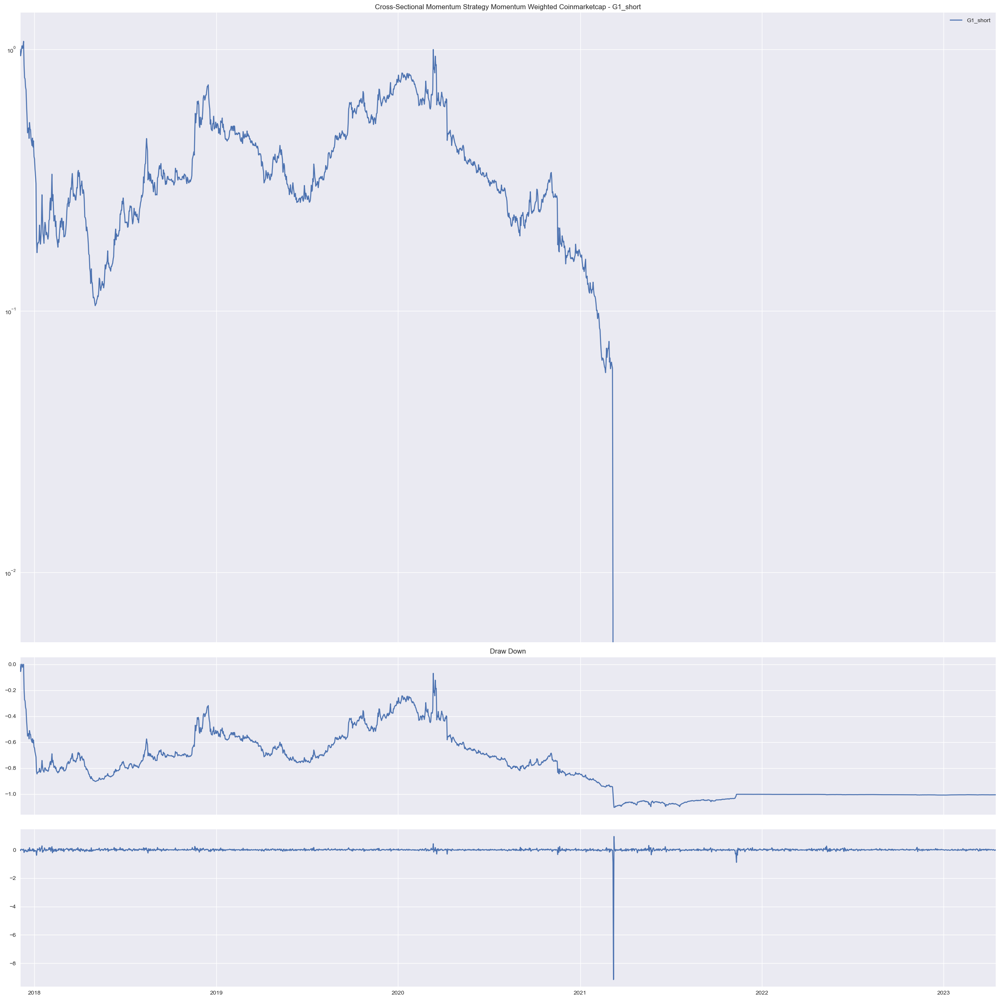

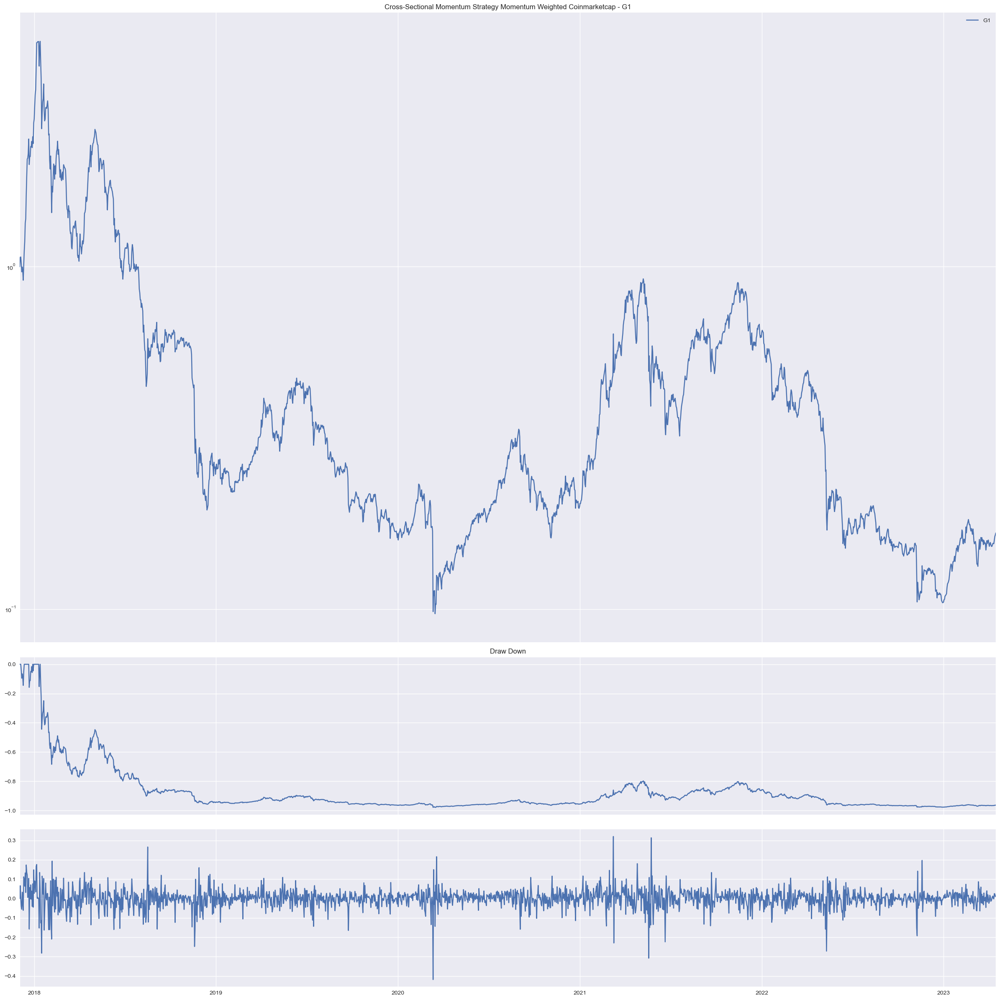

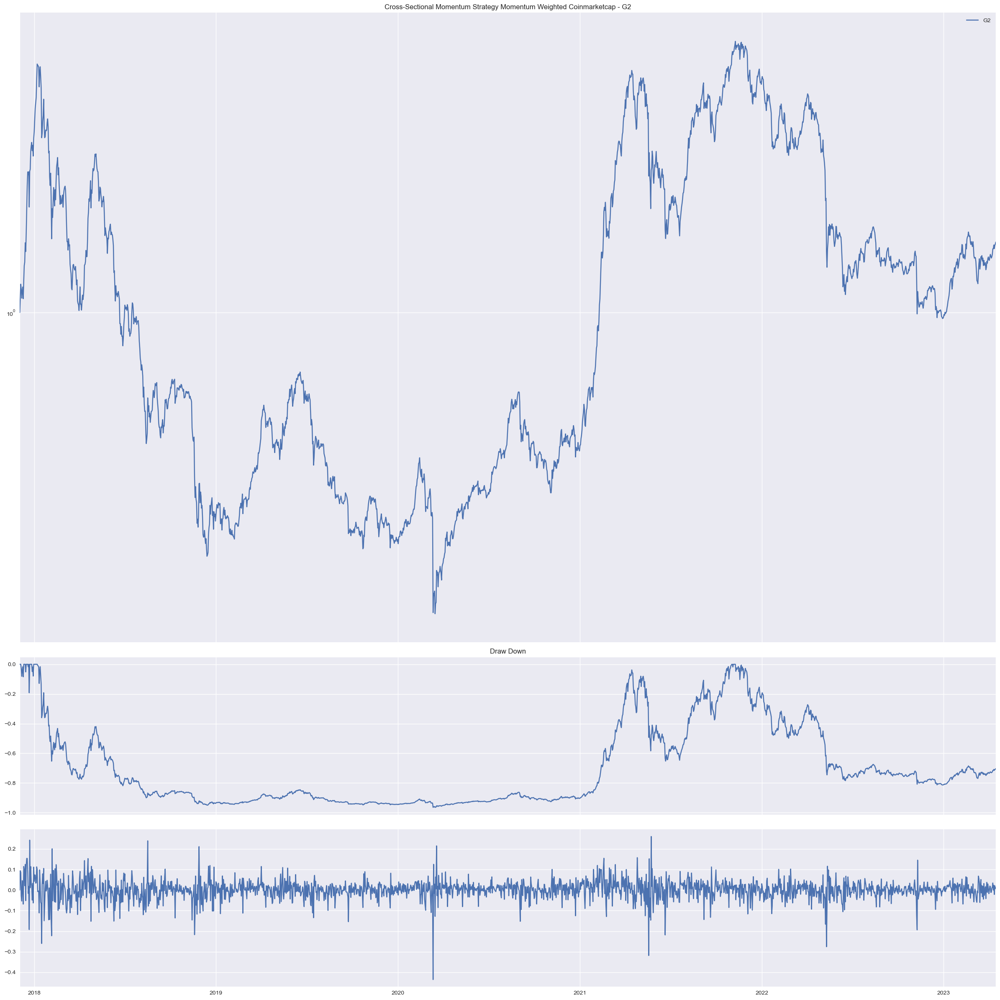

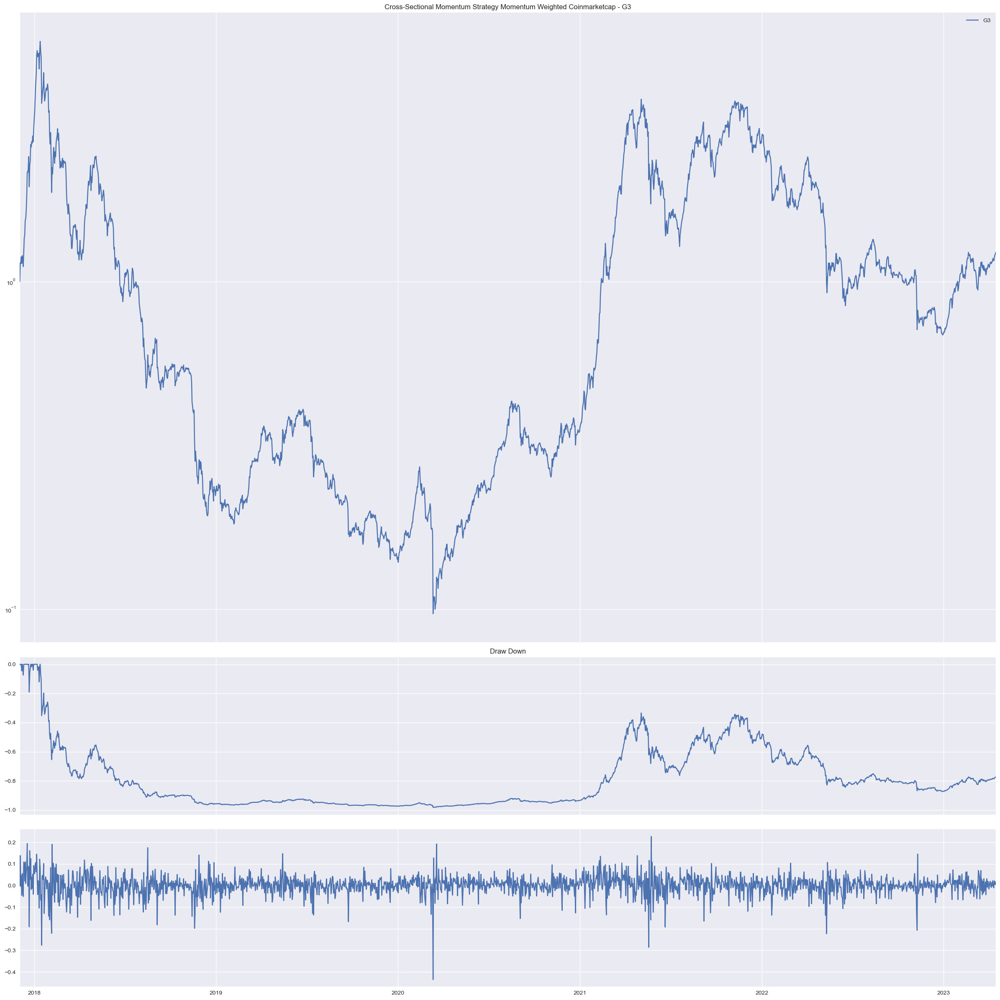

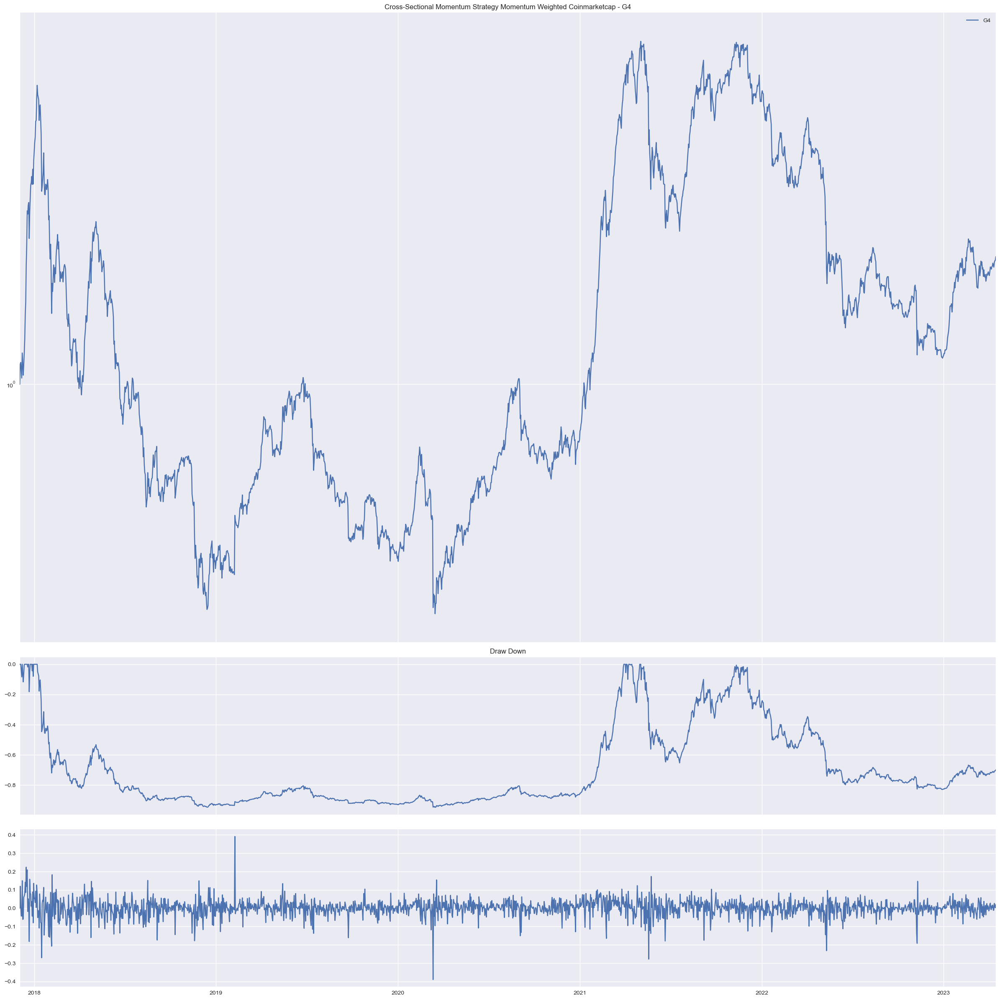

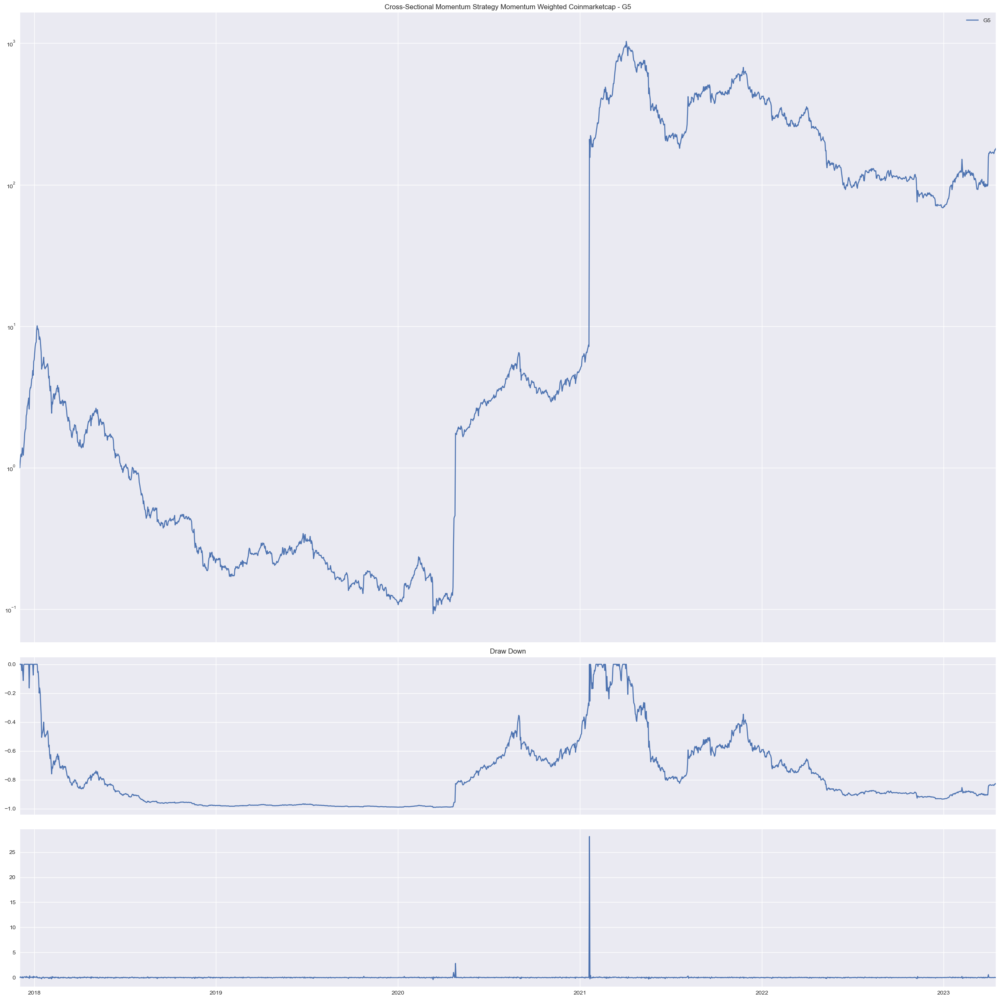

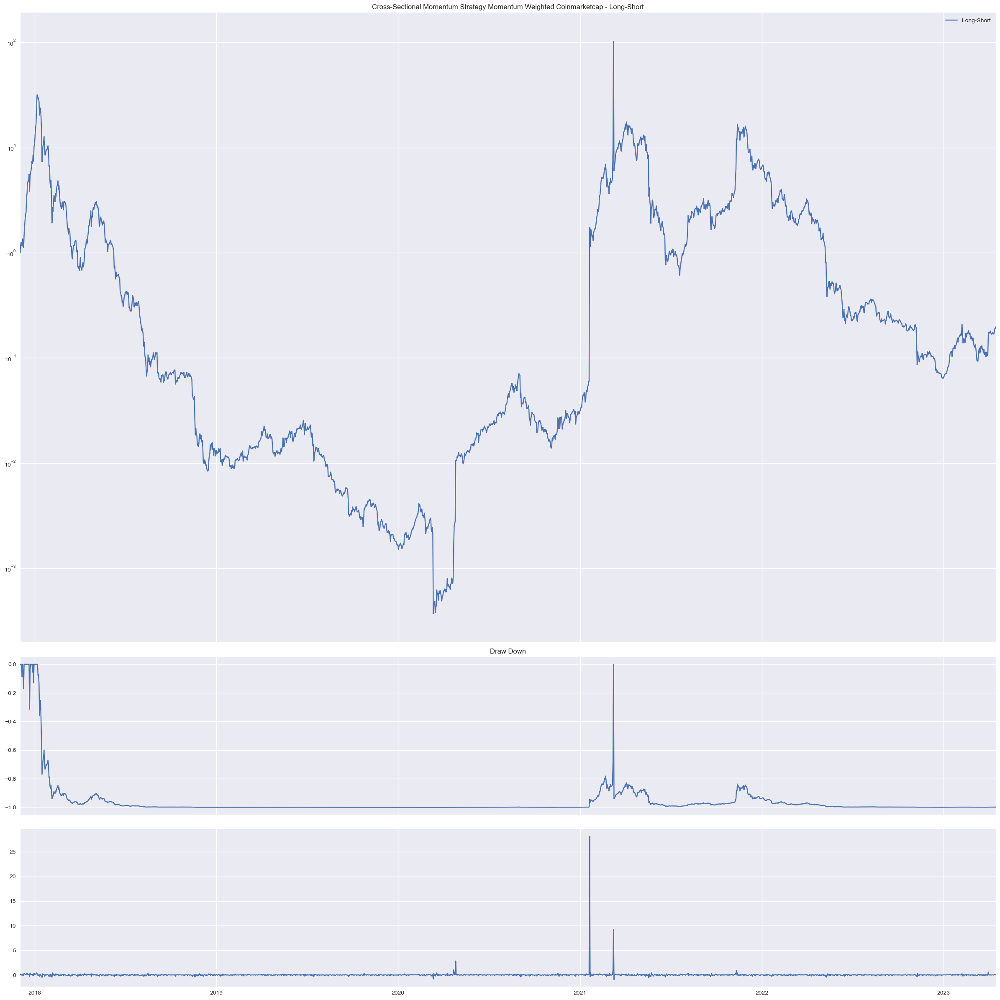

In [30]:
mytool.draw_return_result(momentum_weighted_cmktcap["M2"],
                          title="Cross-Sectional Momentum Strategy Momentum Weighted Coinmarketcap")

In [60]:
mytool.print_statistics(momentum_weighted_cmktcap["M3"])

,G1_short,G1,G2,G3,G4,G5,Long-Short
CAGR,-0.229500,-0.418600,-0.216700,-0.050200,-0.148700,-0.430800,-0.910300
Mean,0.319280,-0.039390,0.265270,0.397690,0.282450,-0.019360,-0.338630
STD,1.048879,0.979593,0.984088,0.917282,0.911286,1.018541,1.919849
MDD,0.973000,0.985000,0.973000,0.959000,0.967000,0.989000,1.000000
Sharpe,0.304401,-0.040211,0.269559,0.433553,0.309946,-0.019008,-0.176384


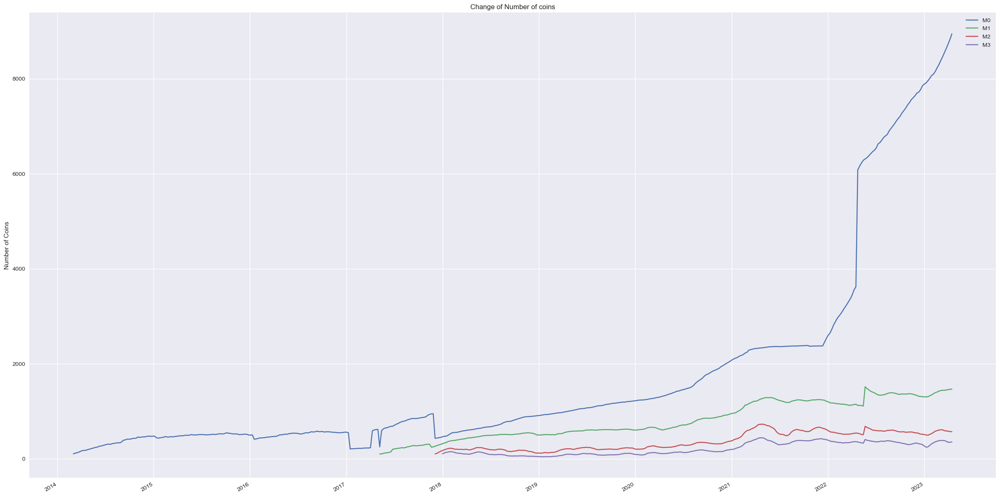

In [32]:
mytool.draw_coin_count(momentum_weighted_num_cmktcap, draw_mkt=False)

In [33]:
# 코인 마켓켑 축소
momentum_weighted_cmktcap_reduced = {}
momentum_weighted_num_cmktcap_reduced = {}

for key, value_lst in group_value.items():
    rtn, num = c_mkt_reduced.weekly_momentum_momentum_weighted(4,"SUN", 15, value_lst[0],value_lst[1])
    momentum_weighted_cmktcap_reduced[key] = rtn
    momentum_weighted_num_cmktcap_reduced[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 4/4 [00:01<00:00,  2.96it/s]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


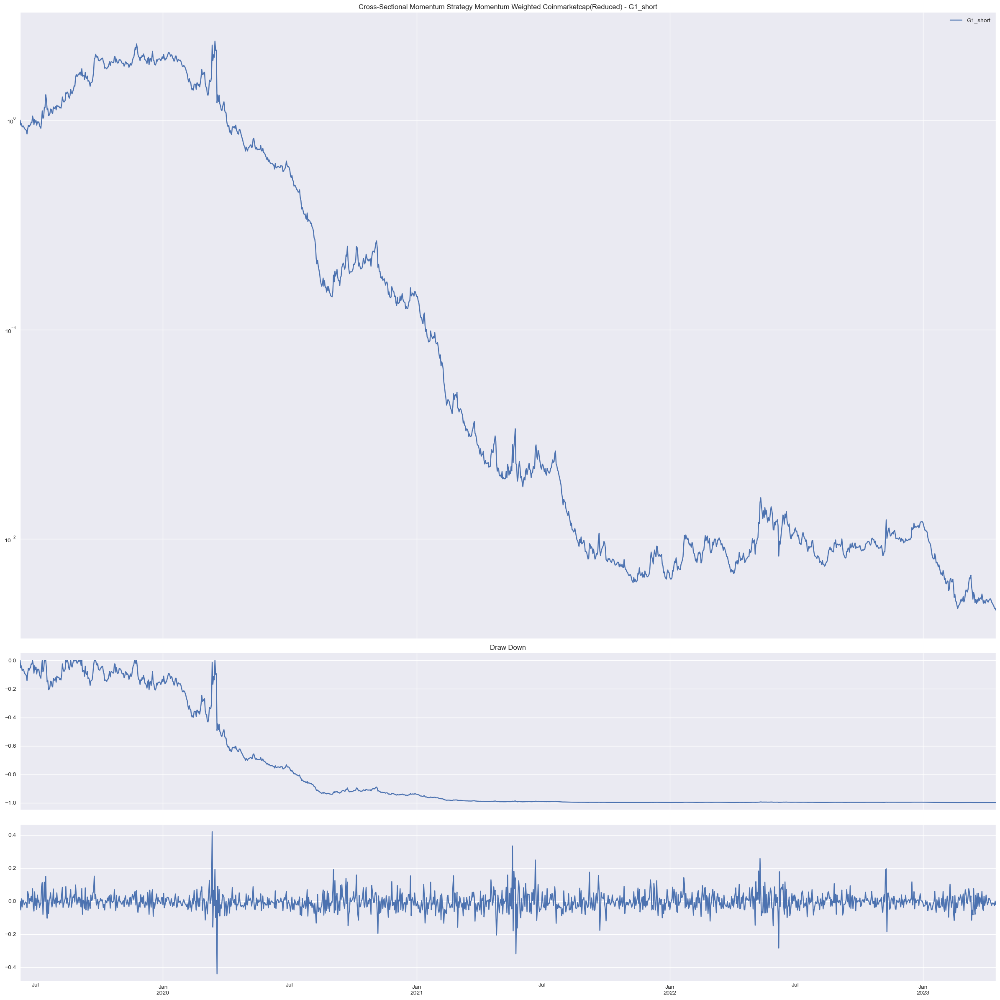

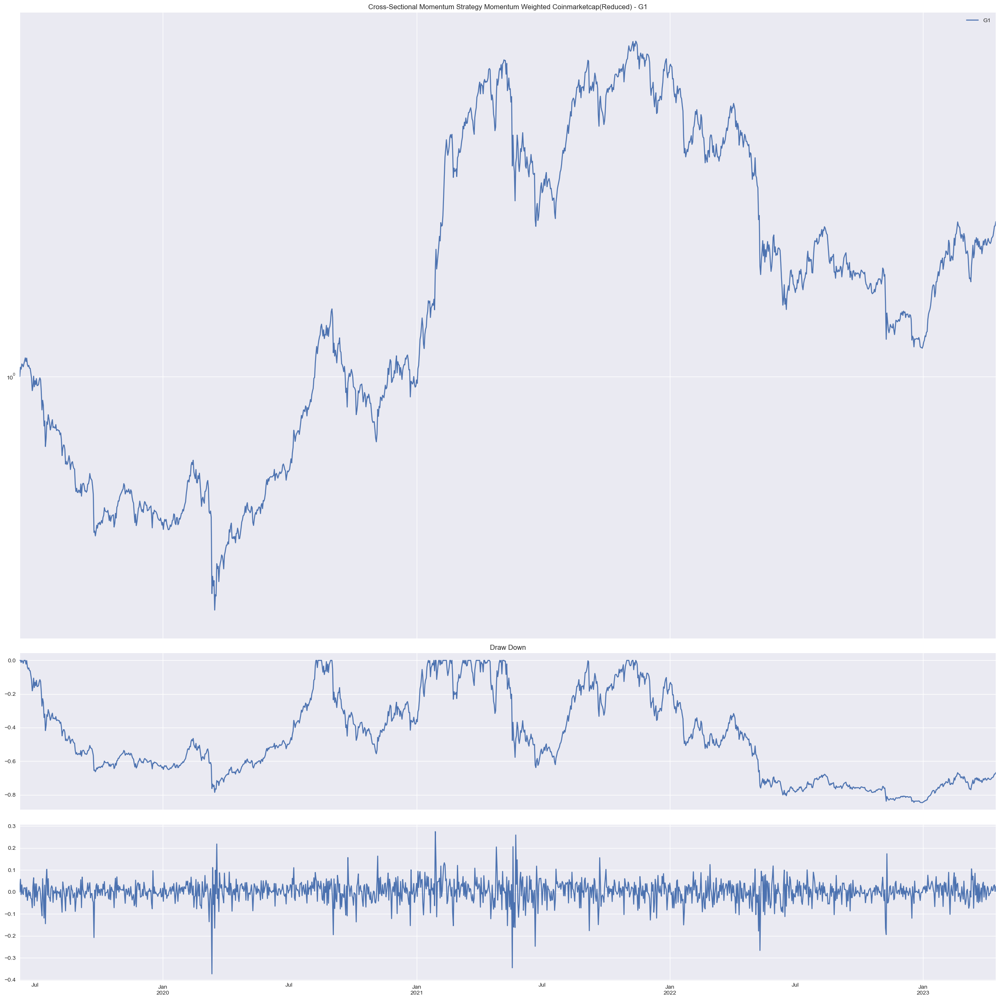

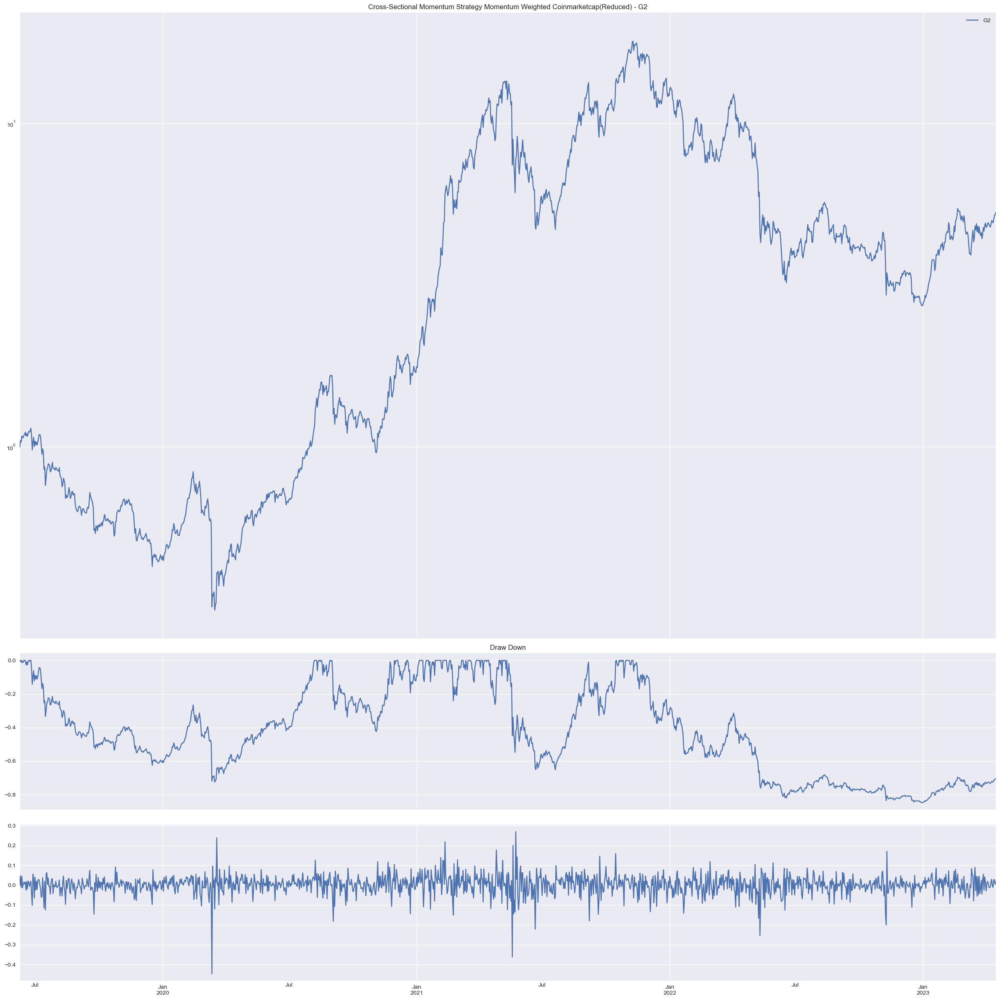

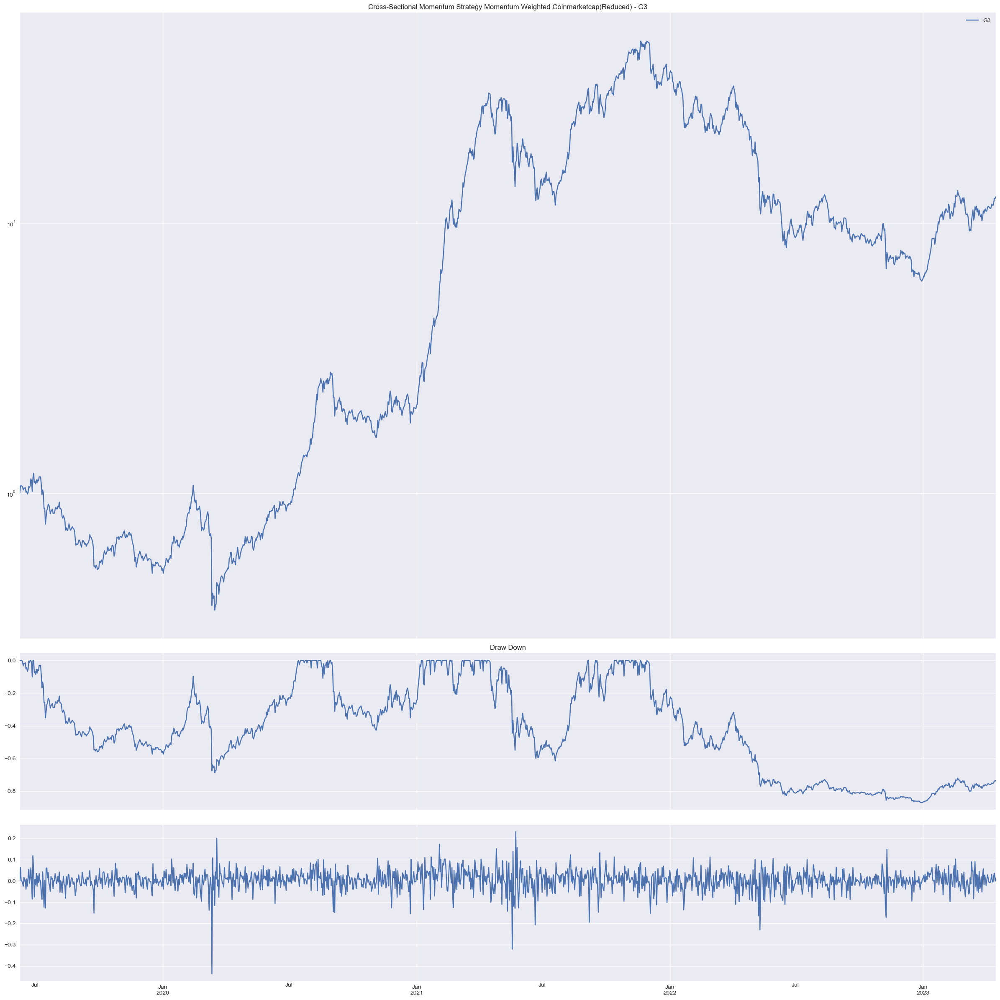

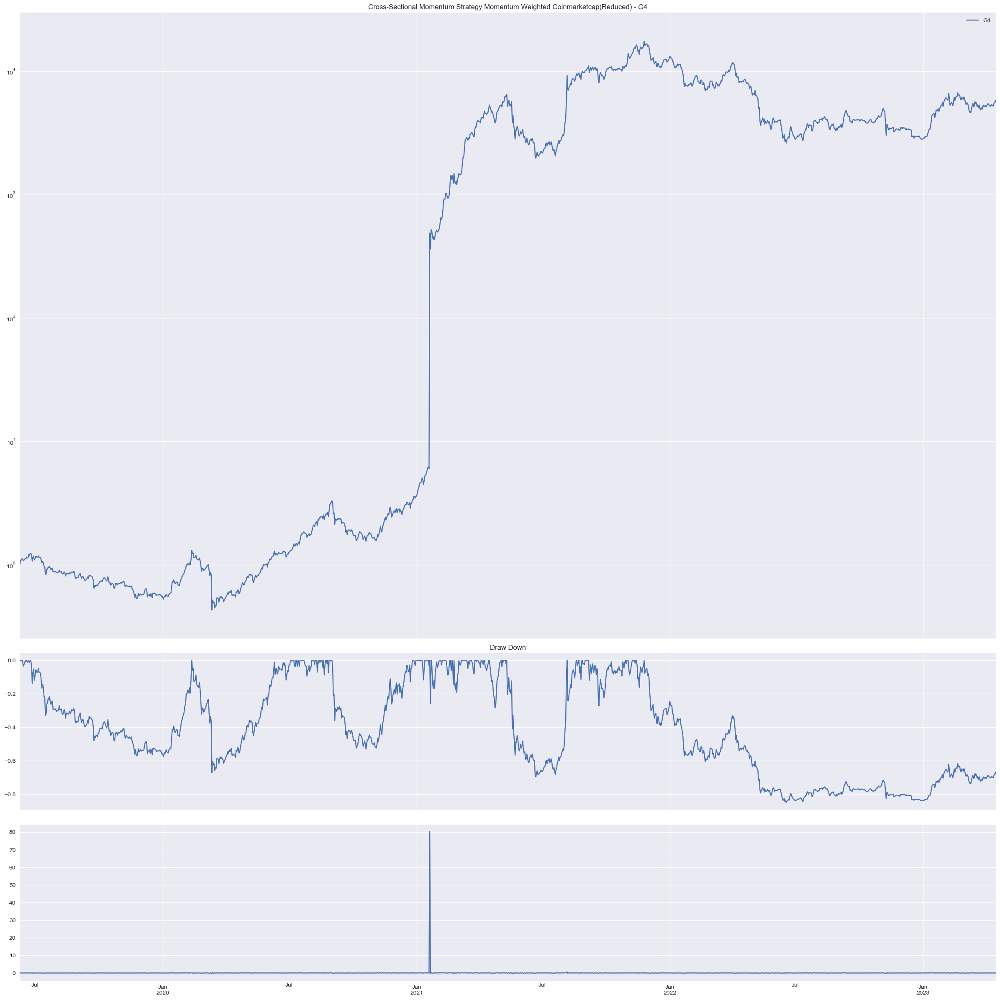

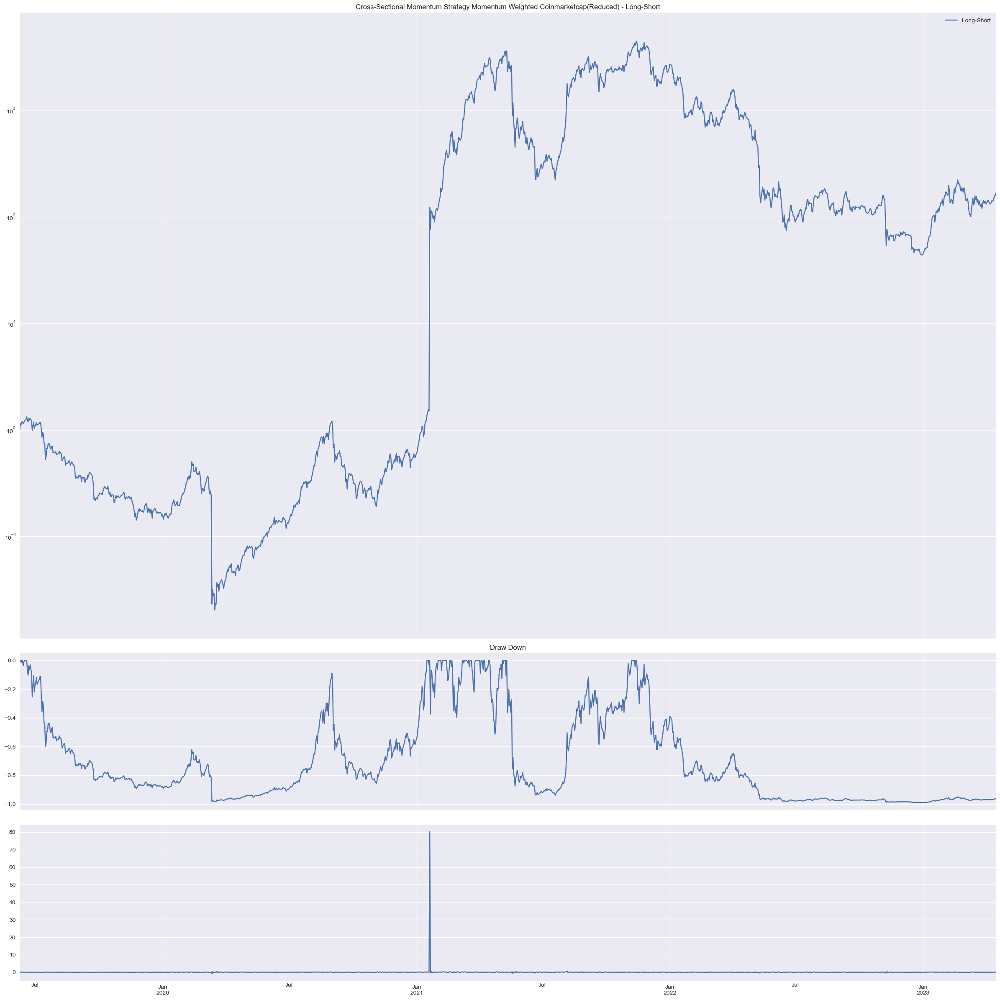

In [65]:
mytool.draw_return_result(momentum_weighted_cmktcap_reduced["M2"],
                          title="Cross-Sectional Momentum Strategy Momentum Weighted Coinmarketcap(Reduced)")

In [63]:
mytool.print_statistics(momentum_weighted_cmktcap_reduced["M3"])

,G1_short,G1,G2,G3,G4,Long-Short
CAGR,-0.810900,0.474500,0.883500,1.066500,2.877500,1.216500
Mean,-1.096820,0.910280,1.139220,1.216070,2.015000,3.111830
STD,1.075441,0.994835,0.975447,0.957005,1.139333,2.070092
MDD,0.992000,0.856000,0.853000,0.879000,0.844000,0.991000
Sharpe,-1.019880,0.915006,1.167896,1.270704,1.768578,1.503232


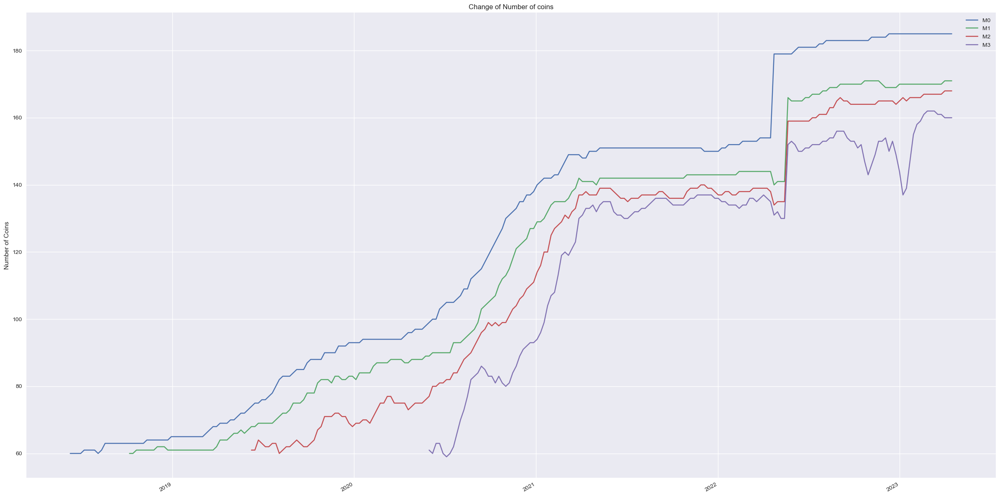

In [36]:
mytool.draw_coin_count(momentum_weighted_num_cmktcap_reduced, draw_mkt=False)

In [37]:
# 바이낸스
momentum_weighted_binance = {}
momentum_weighted_num_binance = {}

for key, value_lst in group_value.items():
    rtn, num = b_mkt.weekly_momentum_momentum_weighted(4,"SUN", 15, value_lst[0],value_lst[1])
    momentum_weighted_binance[key] = rtn
    momentum_weighted_num_binance[key] = num  # 딕셔너리의 딕셔너리가 들어있겠군

100%|██████████| 4/4 [00:01<00:00,  2.99it/s]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


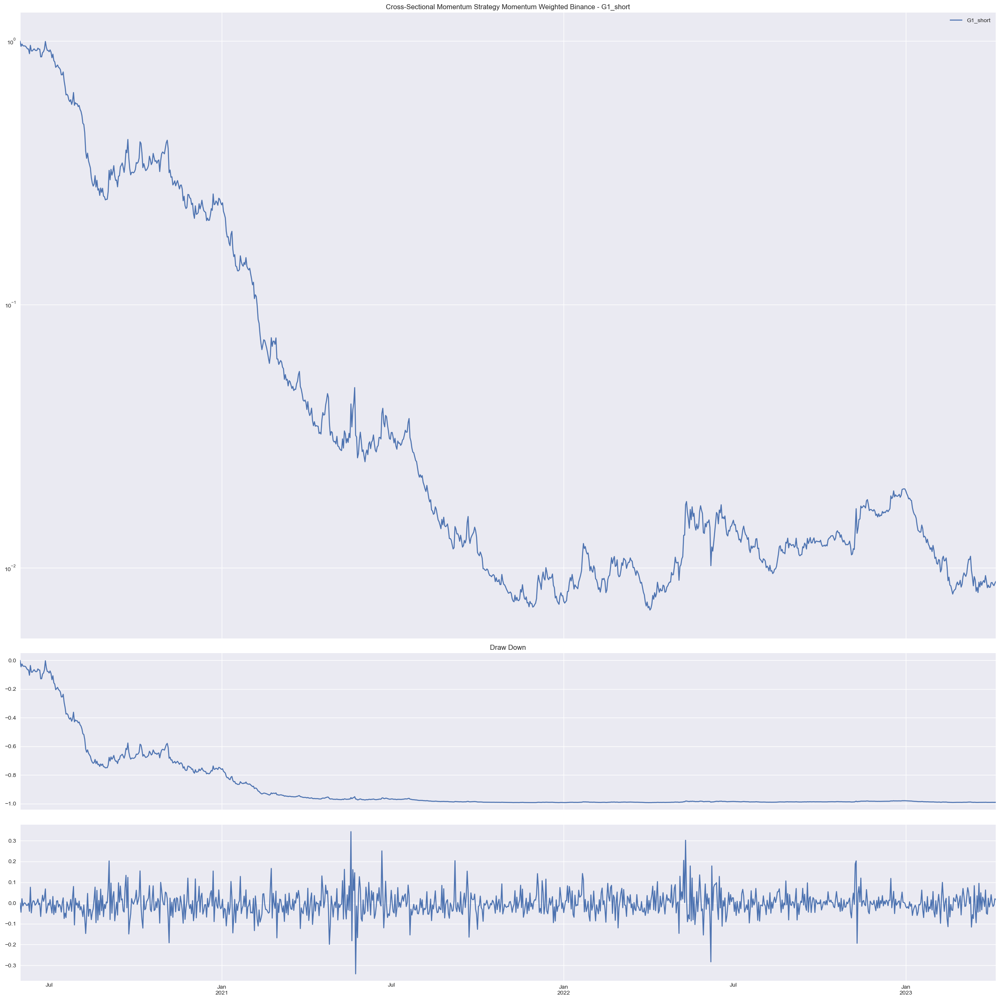

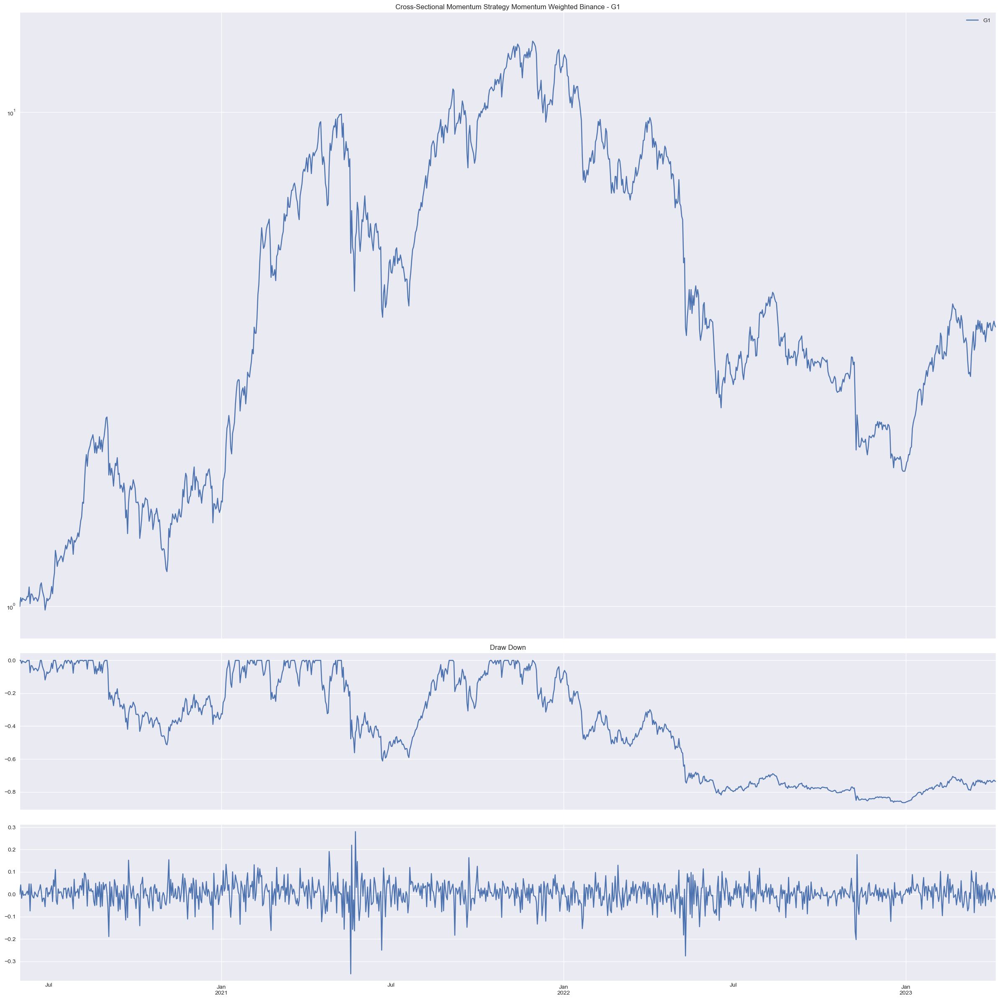

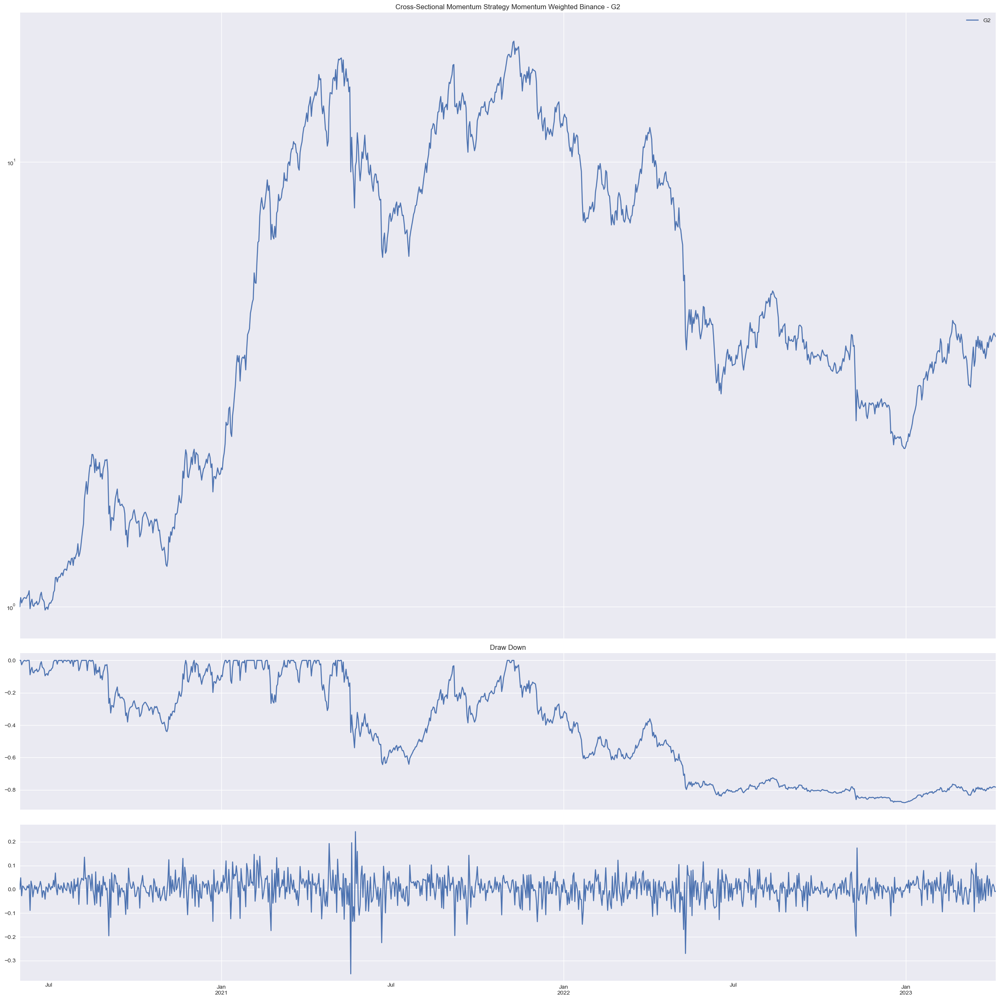

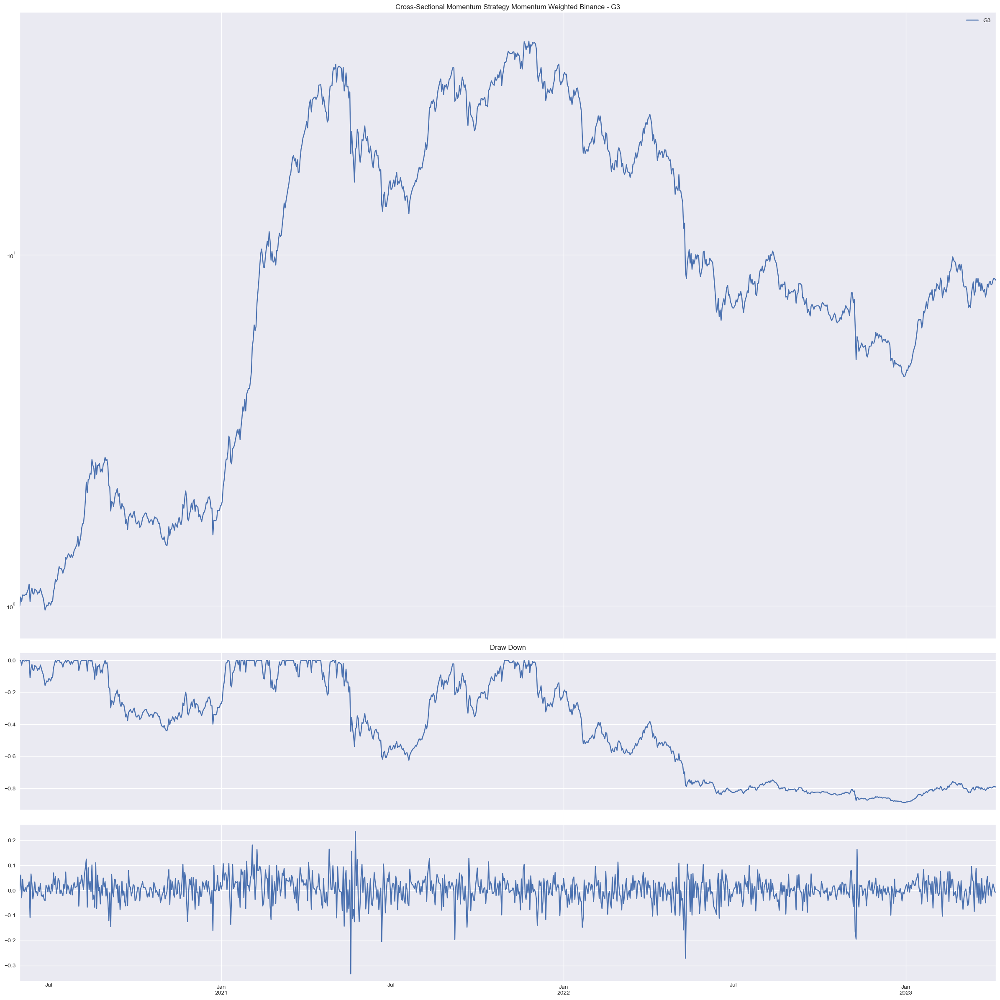

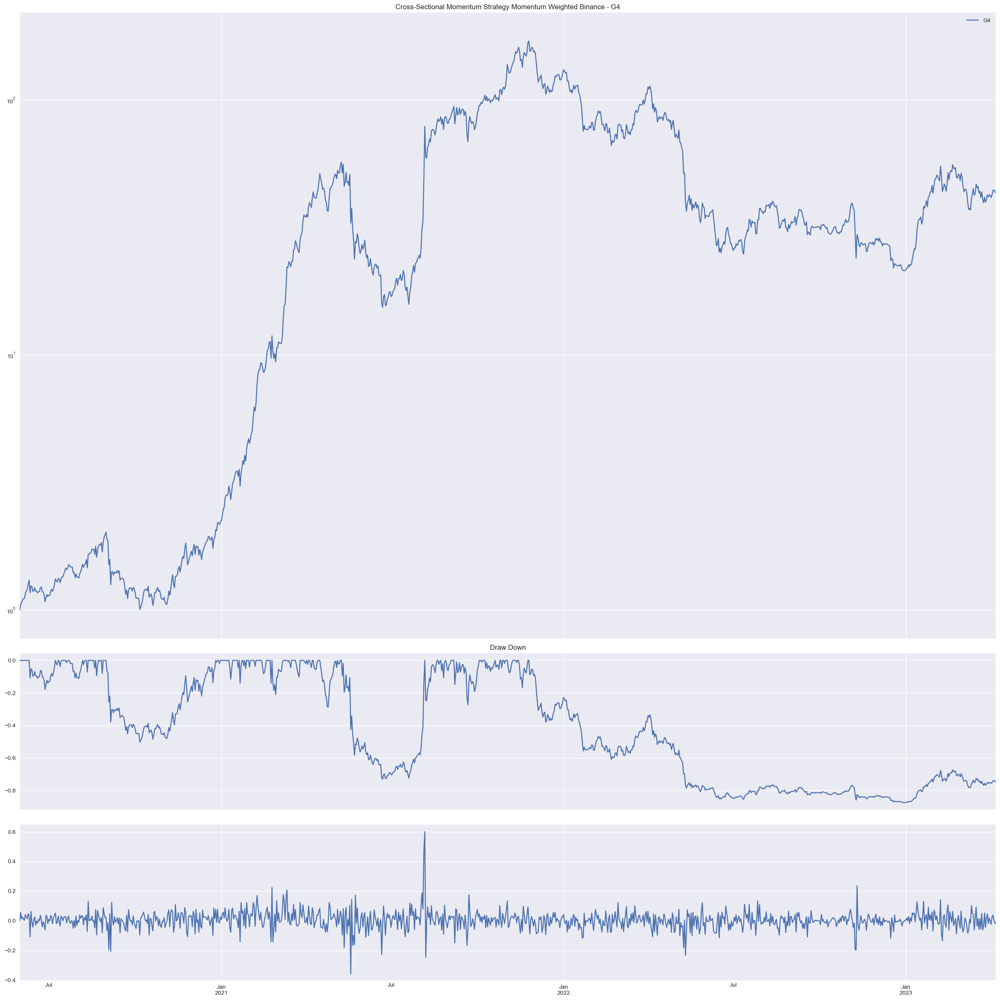

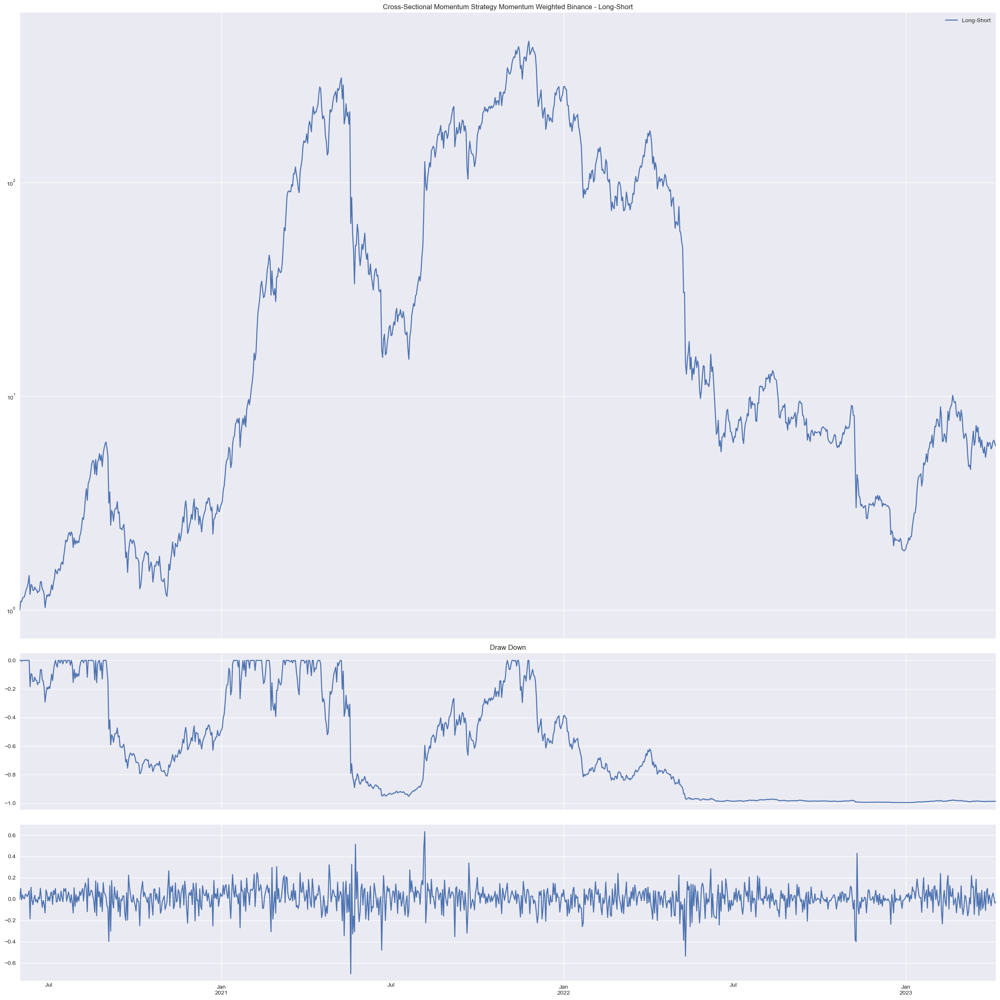

In [38]:
mytool.draw_return_result(momentum_weighted_binance["M3"],
                          title="Cross-Sectional Momentum Strategy Momentum Weighted Binance")

In [71]:
mytool.print_statistics(momentum_weighted_binance["M3"])

,G1_short,G1,G2,G3,G4,Long-Short
CAGR,-0.806200,0.555700,0.605100,1.071100,2.678500,0.796800
Mean,-1.043260,0.994680,0.998180,1.237770,1.990220,3.033480
STD,1.104812,1.022228,0.993424,0.975710,1.165223,2.116965
MDD,0.993000,0.865000,0.879000,0.889000,0.874000,0.996000
Sharpe,-0.944287,0.973051,1.004788,1.268583,1.708017,1.432938


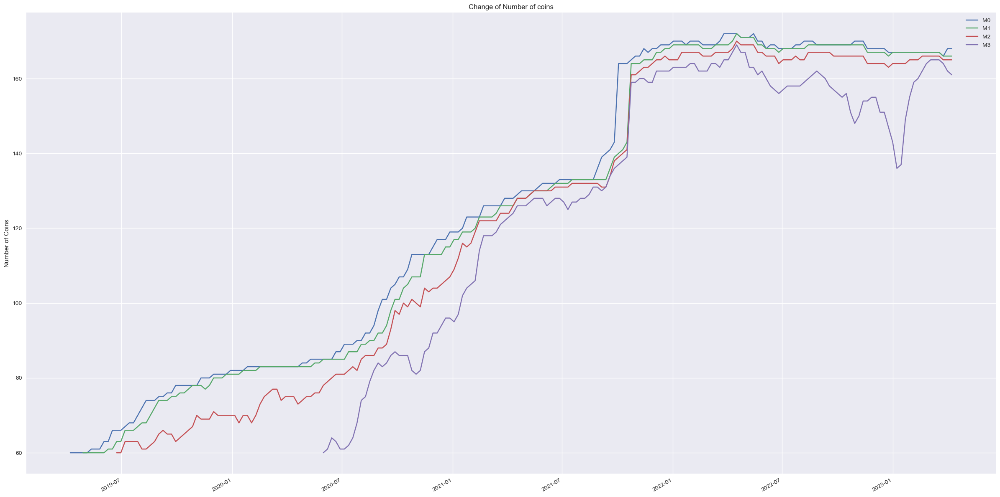

In [40]:
mytool.draw_coin_count(momentum_weighted_num_binance, draw_mkt=False)